## Quality Control

In [1]:
# Core scverse libraries
import scanpy as sc
import anndata as ad
import numpy as np
import seaborn as sns
from scipy.stats import median_abs_deviation
# Data retrieval
import pooch

In [2]:
adata = sc.read("Downloads/Data_Brain/Brain_Combined.h5ad")

/home/ubuntu/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [3]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [4]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

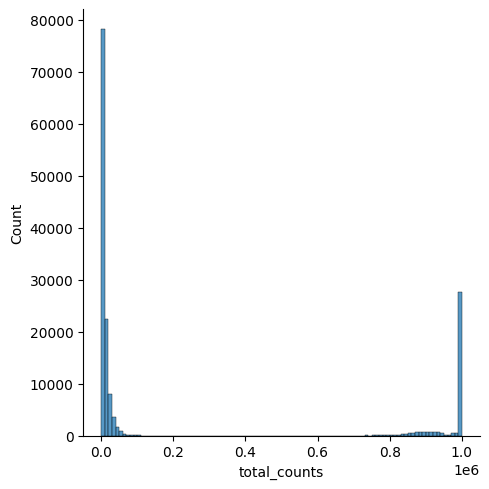

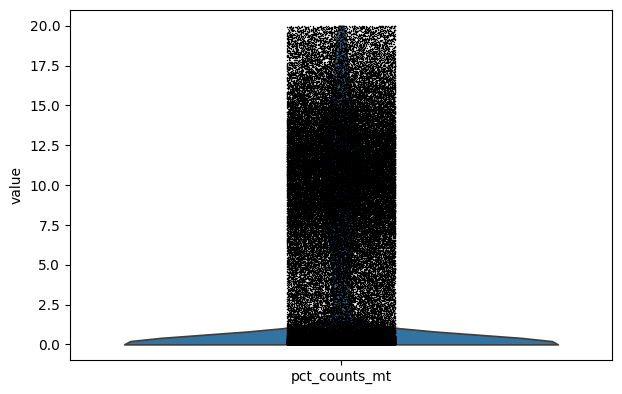

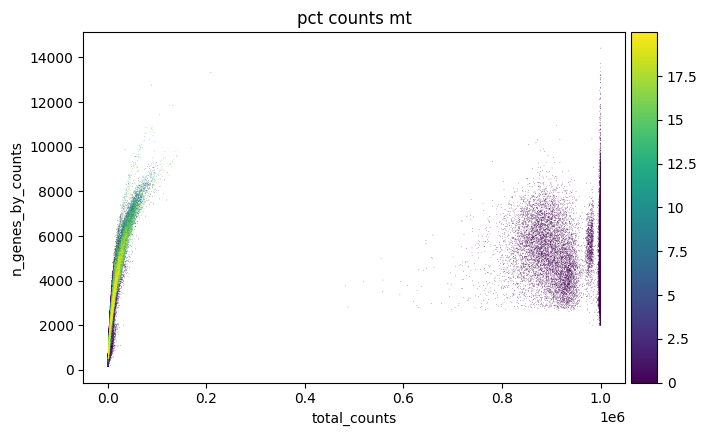

In [5]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [6]:
# Remove cells with very low or very high total counts
adata = adata[adata.obs.total_counts > 500, :]      # Lower bound (adjust if needed)
adata = adata[adata.obs.total_counts < 100000, :]   # Upper bound — you can try 200k or 250k too

# Optional: filter cells with too few or too many genes
adata = adata[adata.obs.n_genes_by_counts > 200, :]
adata = adata[adata.obs.n_genes_by_counts < 6000, :]

# Optional: filter cells with too much mitochondrial content
adata = adata[adata.obs.pct_counts_mt < 5, :]


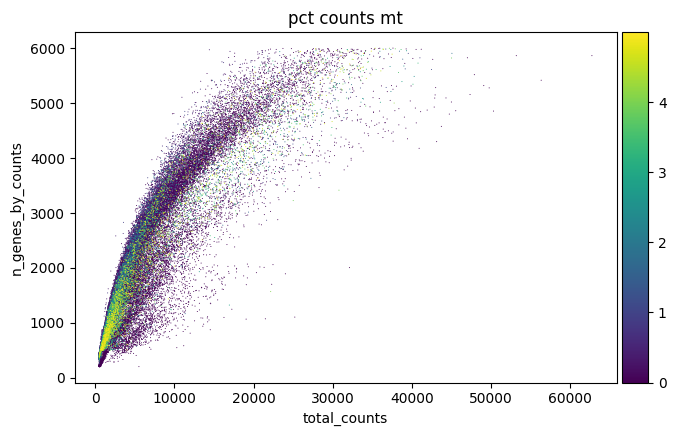

In [7]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [8]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [9]:
print(adata.obs.columns)


Index(['cell_name', 'sample', 'patient', 'cell_type', 'cell_subtype',
       'complexity', 'cell_cycle_phase', 'source', 'cancer_type', 'technology',
       'n_cells', 'age', 'disease_extent', 'sex', 'sample_primary_met',
       'treated_naive', 'site', 'study', 'category', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
       'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'],
      dtype='object')


In [10]:
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_50_genes", 5)
)
adata.obs.outlier.value_counts()

/tmp/ipykernel_15769/702250040.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["outlier"] = (
/home/ubuntu/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/ubuntu/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


outlier
False    56334
True      1492
Name: count, dtype: int64

In [11]:
adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (
    adata.obs["pct_counts_mt"] > 20
)
adata.obs.mt_outlier.value_counts()

mt_outlier
False    39870
True     17956
Name: count, dtype: int64

In [12]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 57826
Number of cells after filtering of low quality cells: 38617


/home/ubuntu/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


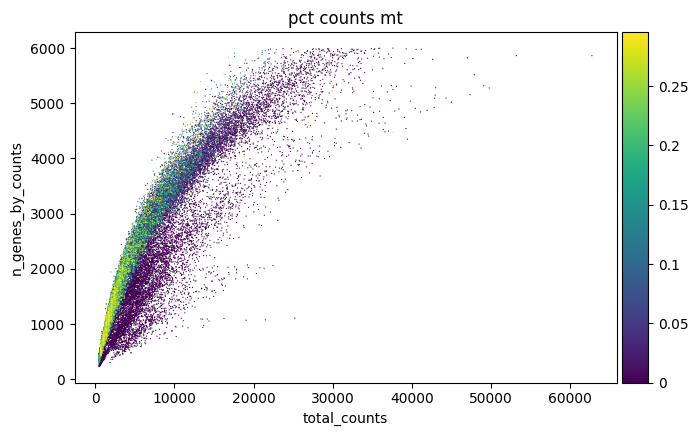

In [13]:
p1 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [19]:
adata.write("Downloads/Data_Brain/Brain_quality_control.h5ad")

## Introduction to scvi-tools

### Loading and preparing data

In [14]:
adata = sc.read("Downloads/Data_Brain/Brain_quality_control.h5ad")

/home/ubuntu/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [15]:
!pip install scvi-tools


Defaulting to user installation because normal site-packages is not writeable


In [16]:
import os
import tempfile

import scanpy as sc
import scvi
import seaborn as sns
import torch

In [17]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.3.3


In [18]:
sc.pp.filter_genes(adata, min_counts=3)

/home/ubuntu/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [19]:
adata.layers["counts"] = adata.X.copy()  # preserve counts
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

adata.raw = adata  # freeze the state in `.raw`

In [20]:
adata.obs['study']

666      Choudhury2022_Brain
14785    Choudhury2022_Brain
14790    Choudhury2022_Brain
15129    Choudhury2022_Brain
15238    Choudhury2022_Brain
                ...         
23788         Yuan2018_Brain
23789         Yuan2018_Brain
23790         Yuan2018_Brain
23791         Yuan2018_Brain
23792         Yuan2018_Brain
Name: study, Length: 38617, dtype: category
Categories (4, object): ['Choudhury2022_Brain', 'Neftel2019_Brain', 'Wang2019_Brain', 'Yuan2018_Brain']

In [21]:
!pip install --user scikit-misc

In [22]:
print(adata.layers.keys())

KeysView(Layers with keys: counts)


In [23]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=1200,
    subset=True,
    flavor="cell_ranger",
    batch_key="study",
)

/home/ubuntu/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [24]:
adata.obs.columns

Index(['cell_name', 'sample', 'patient', 'cell_type', 'cell_subtype',
       'complexity', 'cell_cycle_phase', 'source', 'cancer_type', 'technology',
       'n_cells', 'age', 'disease_extent', 'sex', 'sample_primary_met',
       'treated_naive', 'site', 'study', 'category', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
       'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier',
       'mt_outlier'],
      dtype='object')

In [25]:
adata.obs

,cell_name,sample,patient,cell_type,cell_subtype,complexity,cell_cycle_phase,source,cancer_type,technology,...,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,outlier,mt_outlier
666,MSC1_CACAGGCGTAACGCGA,MSC1,1,Malignant,G1 phase meningioma cells,792,NaN,Meningioma,Meningioma,10x,...,1.386294,0.207756,250.0,5.525453,17.313021,0.0,0.000000,0.000000,False,False
14785,MSC4-Dura_AGTGACTGTTAGGCCC,MSC4-Dura,4,Pericyte,Pericytes,1043,Not cycling,Dura,Meningioma,10x,...,1.791759,0.190913,799.0,6.684612,30.507828,0.0,0.000000,0.000000,False,False
14790,MSC4-Dura_ATACCTTAGCGTGAGT,MSC4-Dura,4,Pericyte,Pericytes,994,NaN,Dura,Meningioma,10x,...,1.609438,0.187705,493.0,6.202536,23.134678,0.0,0.000000,0.000000,False,False
15129,MSC4-Dura_CTGGCAGAGGTTCCAT,MSC4-Dura,4,Pericyte,Pericytes,1277,Not cycling,Dura,Meningioma,10x,...,2.197225,0.288392,689.0,6.536692,24.837780,1.0,0.693147,0.036049,False,False
15238,MSC4-Dura_GCATGATCACAAGCTT,MSC4-Dura,4,T_cell,CD4 T cells,1469,Not cycling,Dura,Meningioma,10x,...,2.197225,0.192957,1392.0,7.239215,33.574532,2.0,1.098612,0.048239,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23788,23789,PJ048,PJ048,Malignant,NaN,361,NaN,NaN,Glioblastoma,Microwell array-based platform,...,0.000000,0.000000,151.0,5.023880,30.079681,0.0,0.000000,0.000000,False,False
23789,23790,PJ048,PJ048,Malignant,NaN,348,NaN,NaN,Glioblastoma,Microwell array-based platform,...,0.000000,0.000000,151.0,5.023880,30.079681,0.0,0.000000,0.000000,False,False
23790,23791,PJ048,PJ048,Malignant,NaN,413,NaN,NaN,Glioblastoma,Microwell array-based platform,...,0.000000,0.000000,51.0,3.951244,10.159363,1.0,0.693147,0.199203,False,False
23791,23792,PJ048,PJ048,Malignant,NaN,370,NaN,NaN,Glioblastoma,Microwell array-based platform,...,0.000000,0.000000,168.0,5.129899,33.466137,0.0,0.000000,0.000000,False,False


In [41]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    categorical_covariate_keys=["study", "sample"],
    continuous_covariate_keys=["pct_counts_mt", "pct_counts_ribo"],
)

/home/ubuntu/.local/lib/python3.10/site-packages/scvi/data/fields/_arraylike_field.py:421: UserWarning: Category 10 in adata.obs['sample'] has fewer than 3 cells. Models may not train properly.
  mapping = _make_column_categorical(df, key, key, categorical_dtype=categorical_dtype)


### Creating and training a model

In [42]:
model = scvi.model.SCVI(adata)

In [43]:
model

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

In [44]:
model.train()

/home/ubuntu/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:789: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ubuntu/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:789: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/home/ubuntu/.local/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Training:   0%|          | 0/207 [00:00<?, ?it/s]

/home/ubuntu/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:789: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/home/ubuntu/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:789: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/home/ubuntu/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:789: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/home/ubuntu/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:789: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/home/ubuntu/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:789: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/home/ubuntu/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:789: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/home/ubuntu/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:789: UserW

In [47]:
save_dir = "./Downloads/Data_Brain"
model_dir = os.path.join(save_dir, "scvi_model")
model.save(model_dir, overwrite=True)

In [26]:
model_dir = os.path.join("./Downloads/Data_Brain", "scvi_model")

In [27]:
model = scvi.model.SCVI.load(model_dir, adata=adata)

INFO     File ./Downloads/Data_Brain/scvi_model/model.pt already downloaded                                        


/home/ubuntu/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:789: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/home/ubuntu/.local/lib/python3.10/site-packages/scvi/data/fields/_arraylike_field.py:421: UserWarning: Category 10 in adata.obs['sample'] has fewer than 3 cells. Models may not train properly.
  mapping = _make_column_categorical(df, key, key, categorical_dtype=categorical_dtype)


In [28]:
adata.X.max()

np.float32(8.097759)

In [29]:
adata.layers

Layers with keys: counts

In [30]:
!pip install SCVI-tools

Defaulting to user installation because normal site-packages is not writeable


## Clustering and Visuaalization

### Introduction to scvi-tools

In [10]:
import os
import tempfile
import scanpy as sc
import scvi
import seaborn as sns
import torch

In [39]:
sc.set_figure_params(figsize=(8, 8), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

### Without batch correction

In [31]:
# run PCA then generate UMAP plots
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata, min_dist=0.3)

In [32]:
print (adata.obs.columns)

Index(['cell_name', 'sample', 'patient', 'cell_type', 'cell_subtype',
       'complexity', 'cell_cycle_phase', 'source', 'cancer_type', 'technology',
       'n_cells', 'age', 'disease_extent', 'sex', 'sample_primary_met',
       'treated_naive', 'site', 'study', 'category', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
       'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier',
       'mt_outlier', '_scvi_batch', '_scvi_labels'],
      dtype='object')


In [34]:
adata.obs['cell_type'].value_counts()

cell_type
Malignant          26978
Myeloid             3219
Macrophage          3080
Oligodendrocyte     3049
Fibroblast           496
Endothelial          407
Pericyte             299
T_cell               165
Astrocyte             26
Monocyte               1
Name: count, dtype: int64

In [8]:
adata.obs['cancer_type'].value_counts()

cancer_type
Glioblastoma    37513
Meningioma         56
Name: count, dtype: int64

In [74]:
adata.obs['site'].value_counts()

site
Brain                   12291
left temporal            6740
Right frontal            3657
right frontal            3581
Right temporal           3168
right parietal           2924
Left temporal            1800
Left frontal             1781
Right frontotemporal     1612
nan                      1007
brain                      56
Name: count, dtype: int64

In [77]:
adata.obs['technology'].value_counts()

technology
Microwell array-based platform    13245
10X                               13025
10x                               12347
Name: count, dtype: int64

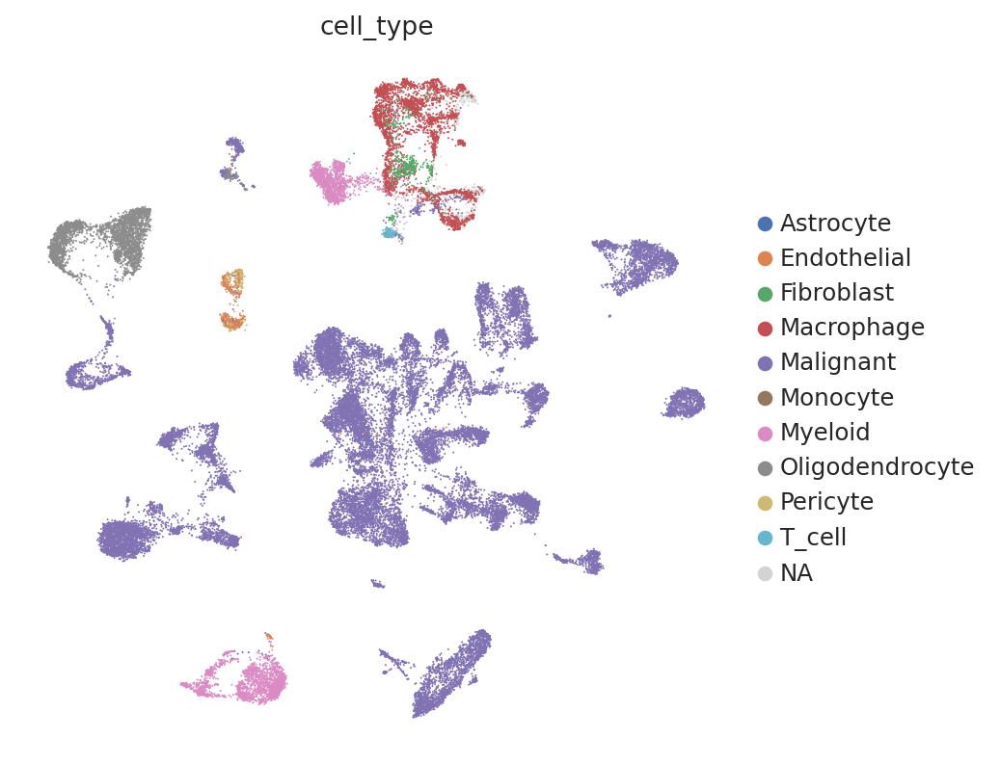

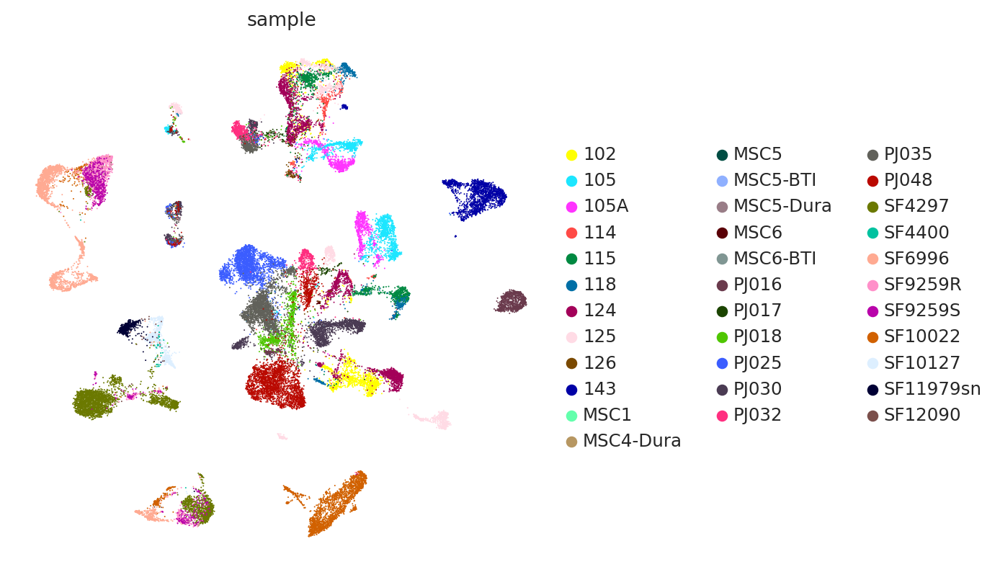

In [35]:
sc.pl.umap(
    adata,
    color=["cell_type"],
    frameon=False,
)
sc.pl.umap(
    adata,
    color=["sample"],
    frameon=False,
)

### with batch correction

In [36]:
SCVI_LATENT_KEY = "X_scVI"
latent = model.get_latent_representation()
adata.obsm[SCVI_LATENT_KEY] = latent
latent.shape

(38617, 10)

In [37]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep=SCVI_LATENT_KEY)
sc.tl.umap(adata, min_dist=0.3)

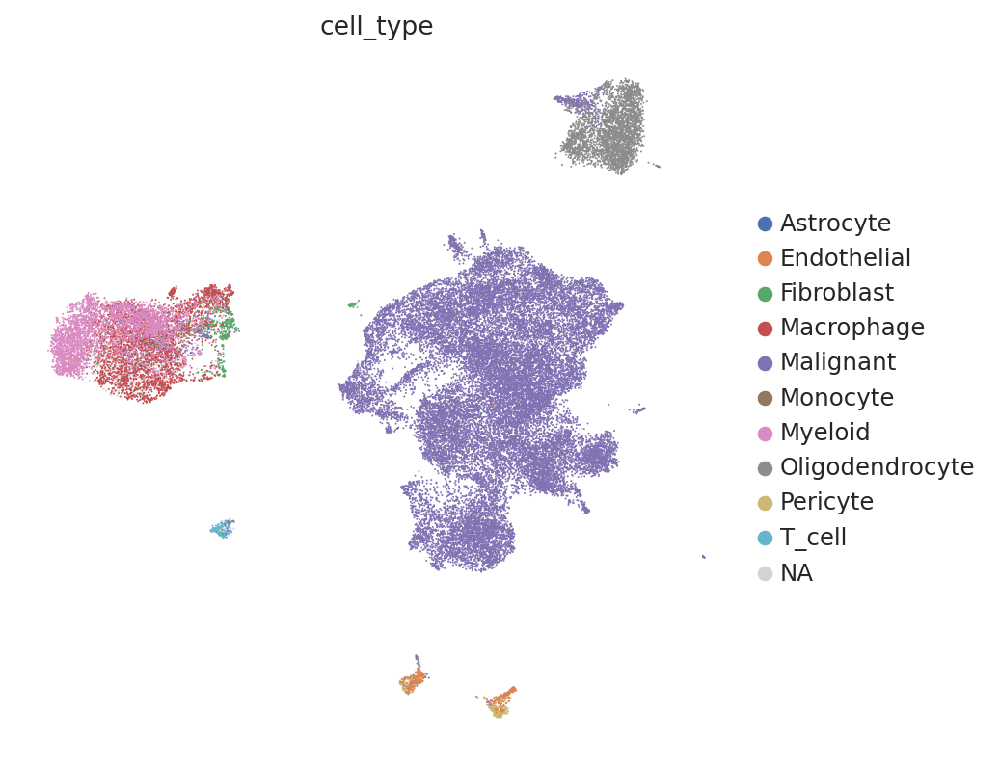

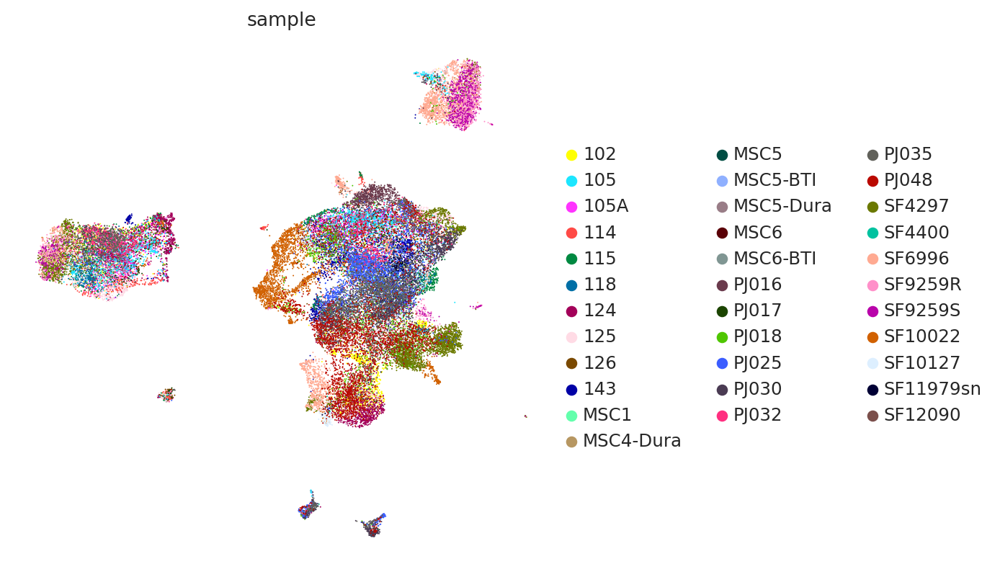

In [38]:
sc.pl.umap(
    adata,
    color=["cell_type"],
    frameon=False,
)
sc.pl.umap(
    adata,
    color=["sample"],
    frameon=False,
)

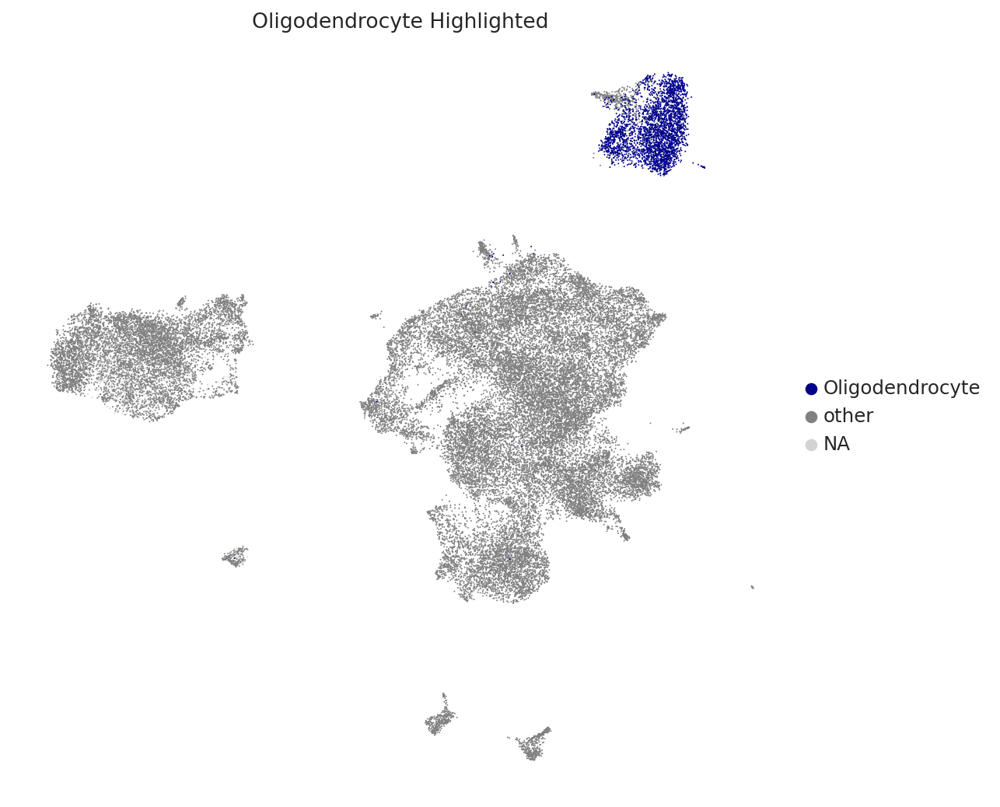

In [41]:
# Create a new column to highlight oligodendrocytes
adata.obs["highlight"] = adata.obs["cell_type"].apply(
    lambda x: "Oligodendrocyte" if x == "Oligodendrocyte" else "other"
)

# Plot with custom colors: gray for others, dark blue for oligodendrocytes
sc.pl.umap(
    adata,
    color="highlight",
    palette=["darkblue", "gray"],
    frameon=False,
    title="Oligodendrocyte Highlighted"
)


In [ ]:
### Manual check of Oligodendrocyte

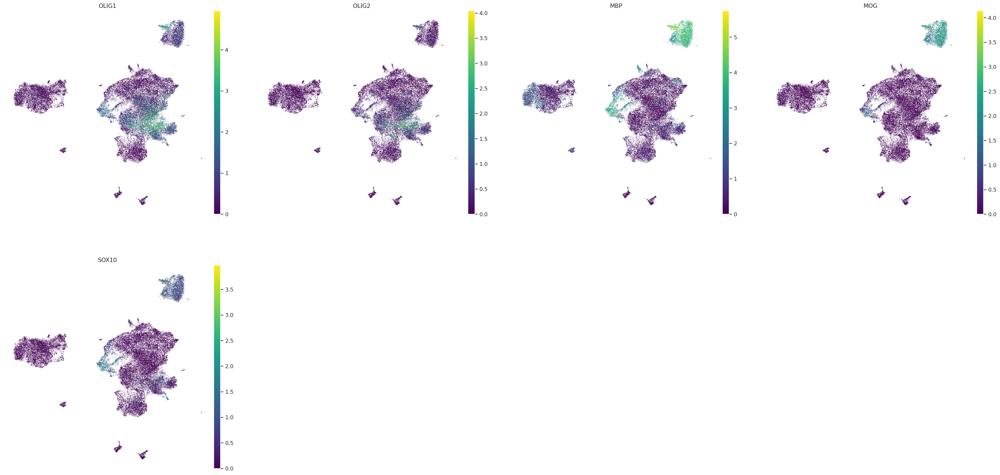

In [42]:
import scanpy as sc

# UMAP plots
sc.pl.umap(adata, color=["OLIG1", "OLIG2", "MBP", "MOG", "SOX10"], cmap="viridis", frameon=False)



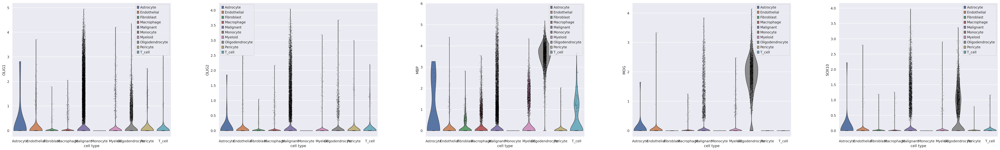

In [70]:
# Violin plots for comparison
sc.pl.violin(adata, keys=["OLIG1", "OLIG2", "MBP", "MOG", "SOX10"], groupby='cell_type')

In [51]:
#Score Cells Based on Marker Genes
oligo_markers = ["OLIG1", "OLIG2", "MBP", "MOG", "SOX10"]
sc.tl.score_genes(adata, gene_list=oligo_markers, score_name='oligodendrocyte_score')

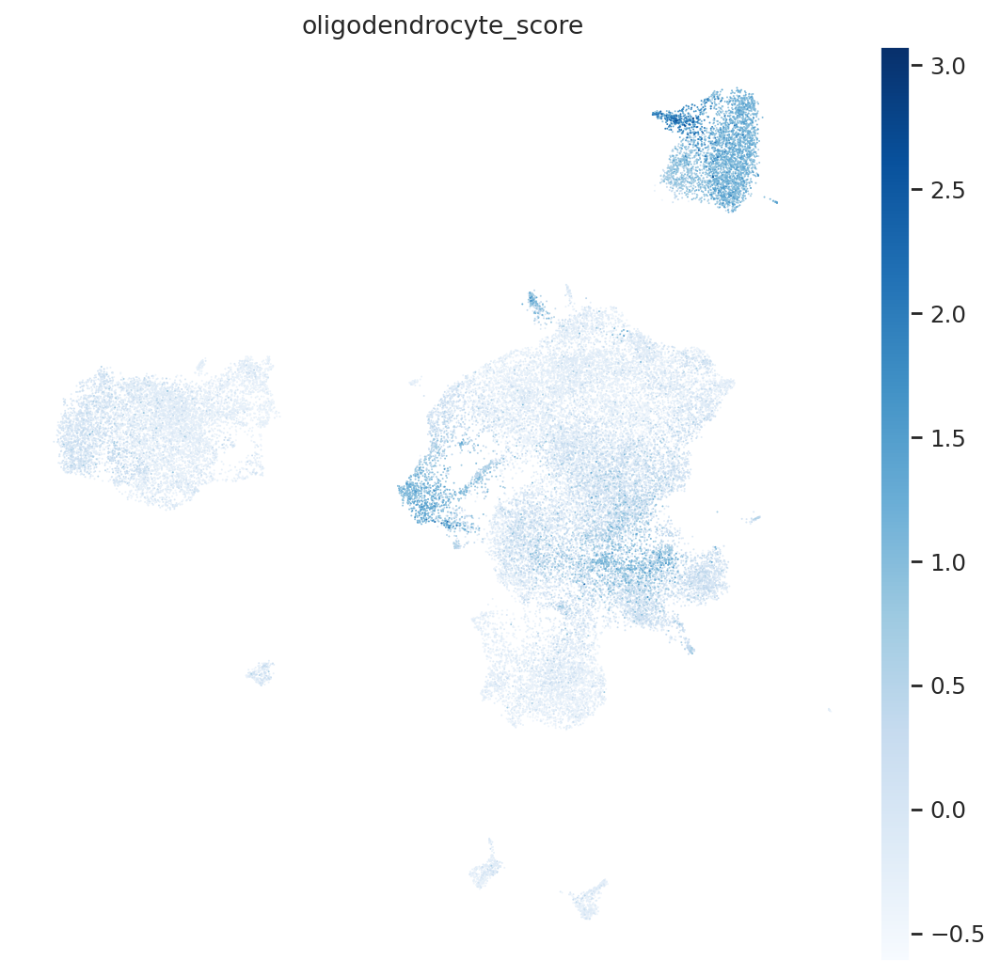

In [52]:
sc.pl.umap(adata, color='oligodendrocyte_score', cmap='Blues', frameon=False)

In [55]:
adata.write("Downloads/Data_Brain/Brain_SCVI.h5ad")

## Annotation

In [45]:
!pip install celltypist

Defaulting to user installation because normal site-packages is not writeable


In [46]:
import celltypist as ct

In [47]:
ct.models.download_models(model=["Developing_Human_Brain.pkl"], force_update=True)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 54
📂 Storing models in /home/ubuntu/.celltypist/data/models
💾 Total models to download: 1
💾 Downloading model [1/1]: Developing_Human_Brain.pkl


In [48]:
model2=ct.models.Model.load(model="Developing_Human_Brain.pkl")

In [60]:
predictions=ct.annotate(adata, model="Developing_Human_Brain.pkl", majority_voting=True)

⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 38617 cells and 1200 genes
🔗 Matching reference genes in the model
🧬 374 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


In [50]:
model2.cell_types

array(['Brain erythrocytes', 'Brain fibroblasts', 'Brain immune cells',
       'Brain neuroblast', 'Brain neuron', 'Brain neuronal IPC',
       'Brain placode cells', 'Brain radial glia', 'Brain vascular cells',
       'Cerebellum glioblast', 'Cerebellum immune cells',
       'Cerebellum neural crest cells', 'Cerebellum neuroblast',
       'Cerebellum neuron', 'Cerebellum neuronal IPC', 'Cerebellum OPC',
       'Cerebellum radial glia', 'Cortex glioblast',
       'Cortex immune cells', 'Cortex neuroblast', 'Cortex neuron',
       'Cortex neuronal IPC', 'Cortex OPC', 'Cortex radial glia',
       'Diencephalon glioblast', 'Diencephalon immune cells',
       'Diencephalon neuroblast', 'Diencephalon neuron',
       'Diencephalon neuronal IPC', 'Diencephalon radial glia',
       'Dorsal midbrain glioblast', 'Dorsal midbrain immune cells',
       'Dorsal midbrain neuroblast', 'Dorsal midbrain neuron',
       'Dorsal midbrain neuronal IPC', 'Dorsal midbrain OPC',
       'Dorsal midbrain radia

In [59]:
adata.obs_names_make_unique()

In [61]:
predictions = ct.annotate(
    adata, model=model2, majority_voting=True
)

⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 38617 cells and 1200 genes
🔗 Matching reference genes in the model
🧬 374 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


In [62]:
predictions_adata = predictions.to_adata()

In [63]:
adata.obs["celltypist_cell_label_fine"] = predictions_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_adata.obs.loc[
    adata.obs.index, "conf_score"
]

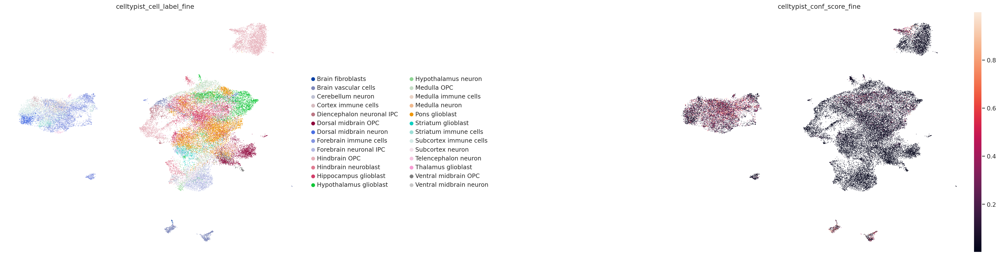

In [64]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

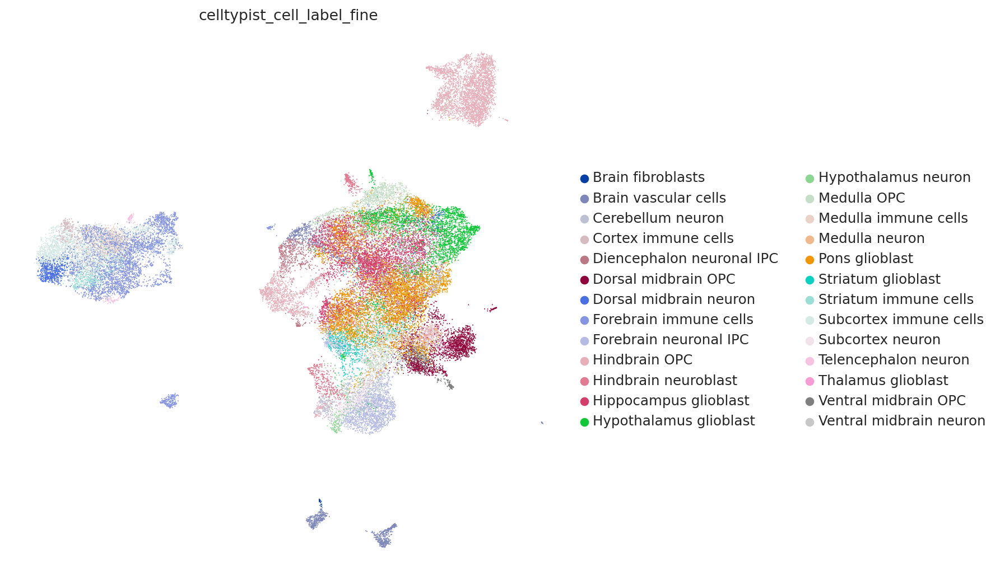

In [65]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

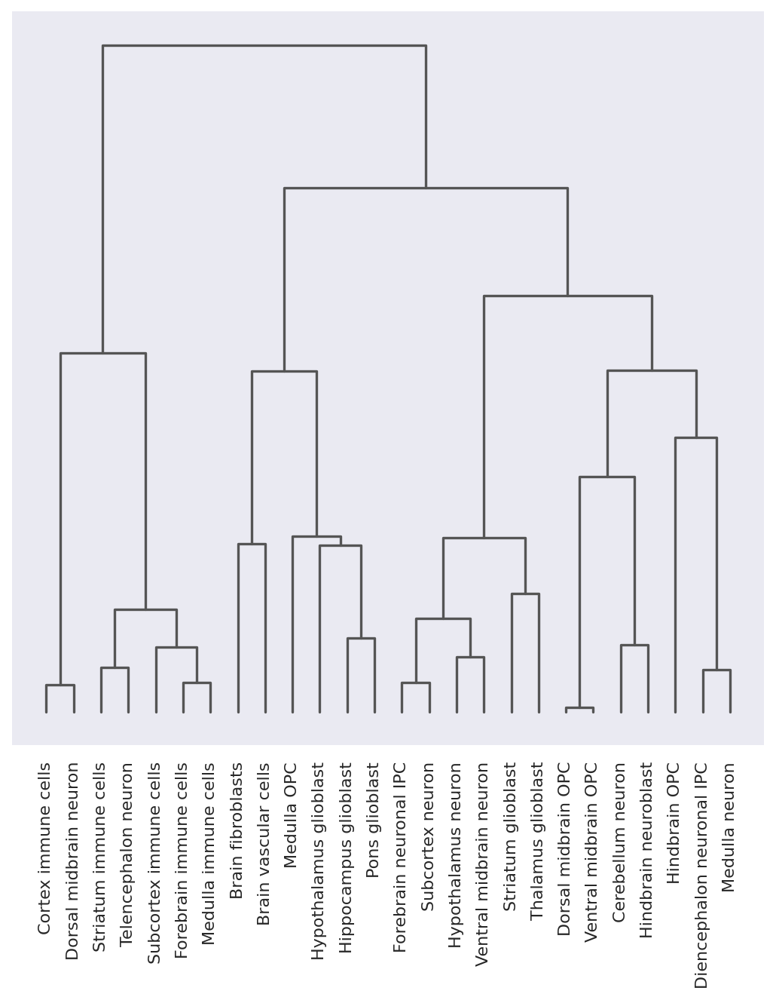

<Axes: >

In [66]:
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine")

In [ ]:
##Manual Annotation

In [280]:
adata = sc.read("./Downloads/Data_Brain/Brain_SCVI.h5ad")

In [281]:
sc.tl.leiden(adata, resolution = 1)

In [282]:
sc.tl.rank_genes_groups(adata, 'leiden')

/home/ubuntu/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/ubuntu/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/ubuntu/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:463: PerformanceWarning: DataFrame is highly fragmented. 

In [284]:
adata.obs['leiden']

666      18
14785    18
14790    18
15129    18
15238    19
         ..
23788    13
23789     1
23790     7
23791     1
23792     5
Name: leiden, Length: 38617, dtype: category
Categories (27, object): ['0', '1', '2', '3', ..., '23', '24', '25', '26']

In [278]:
sc.get.rank_genes_groups_df(adata, None)

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,CD74,300.088928,7.175758,0.0,0.0
1,0,C1QB,235.425034,7.393106,0.0,0.0
2,0,HLA-DRA,220.112411,6.815741,0.0,0.0
3,0,HLA-DRB1,194.070282,6.475277,0.0,0.0
4,0,C1QA,187.106003,6.916771,0.0,0.0
...,...,...,...,...,...,...
1064875,26,RPL15,-239.418213,-32.271557,0.0,0.0
1064876,26,RPL34,-240.793289,-32.318882,0.0,0.0
1064877,26,RPL19,-241.854996,-32.290668,0.0,0.0
1064878,26,RPS18,-242.377777,-32.648949,0.0,0.0


In [273]:
markers = sc.get.rank_genes_groups_df(adata, None)
markers = markers[(markers.pvals_adj < 0.05) & (markers.logfoldchanges > .5)]
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,CD74,300.088928,7.175758,0.000000,0.000000
1,0,C1QB,235.425034,7.393106,0.000000,0.000000
2,0,HLA-DRA,220.112411,6.815741,0.000000,0.000000
3,0,HLA-DRB1,194.070282,6.475277,0.000000,0.000000
4,0,C1QA,187.106003,6.916771,0.000000,0.000000
...,...,...,...,...,...,...
1027747,26,ZDHHC2,2.343457,2.274807,0.033293,0.049719
1027748,26,AC093110.3,2.342051,5.318367,0.033389,0.049844
1027749,26,AGRN,2.341616,2.090507,0.033411,0.049871
1027750,26,APLF,2.341490,2.784920,0.033423,0.049882


In [275]:
model.adata.obs.columns

Index(['cell_name', 'sample', 'condition', 'cell_type', 'cell_subtype',
       'complexity', 'cell_cycle_phase', 'source', 'condition', 'technology',
       'n_cells', 'age', 'disease_extent', 'sex', 'sample_primary_met',
       'treated_naive', 'site', 'study', 'category', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
       'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier',
       'mt_outlier', '_scvi_batch', '_scvi_labels', 'highlight',
       'oligodendrocyte_score', 'predicted_labels', 'over_clustering',
       'majority_voting', 'conf_score', 'celltypist_cell_label_fine',
       'celltypist_conf_score_fine', 'group'],
      dtype='object')

In [276]:
adata.obs.columns

Index(['cell_name', 'sample', 'patient', 'cell_type', 'cell_subtype',
       'complexity', 'cell_cycle_phase', 'source', 'cancer_type', 'technology',
       'n_cells', 'age', 'disease_extent', 'sex', 'sample_primary_met',
       'treated_naive', 'site', 'study', 'category', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
       'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier',
       'mt_outlier', '_scvi_batch', '_scvi_labels', 'highlight',
       'oligodendrocyte_score', 'leiden'],
      dtype='object')

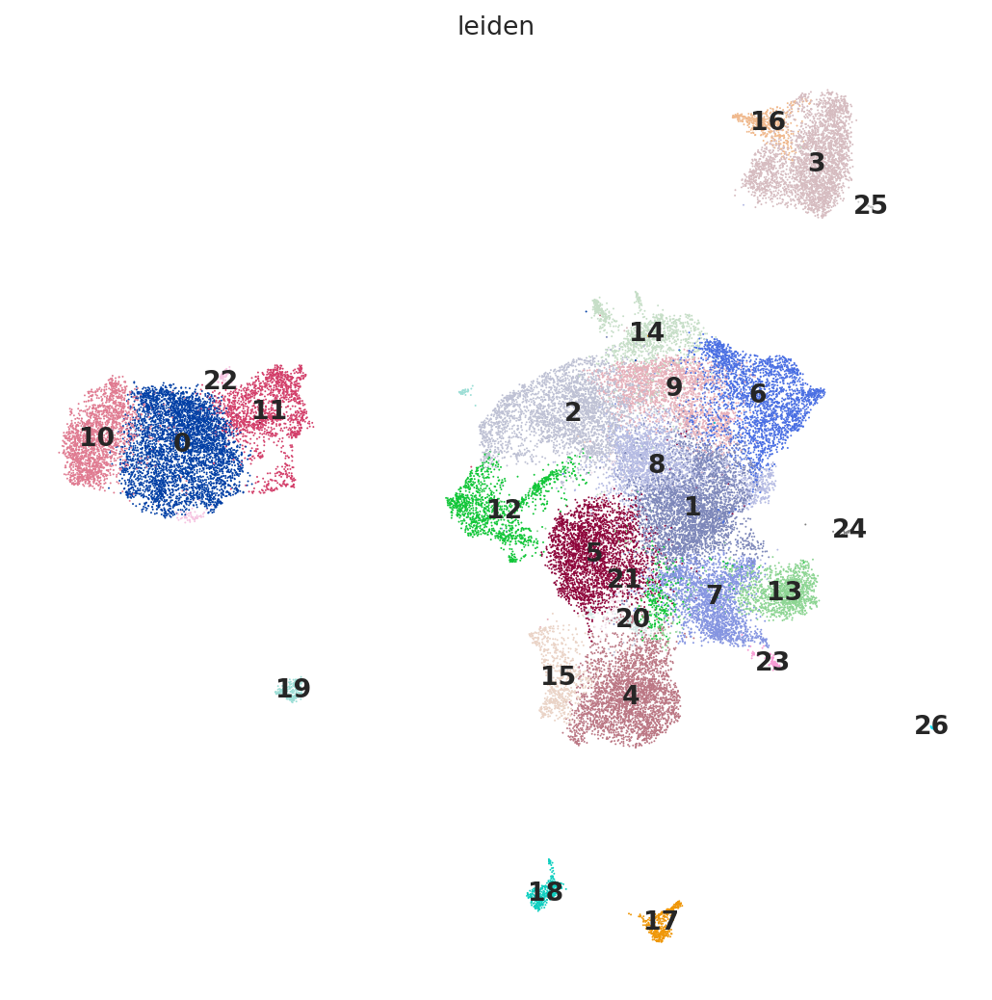

In [291]:
sc.pl.umap(adata, color = ['leiden'], frameon = False, legend_loc = "on data")

## Olygodendrocyte

In [363]:
# Create a new AnnData object with only oligodendrocytes
adata_oligo = adata[adata.obs["cell_type"] == "Oligodendrocyte"].copy()

In [362]:
adata.write("Downloads/Data_Brain/Brain_oligo.h5ad")

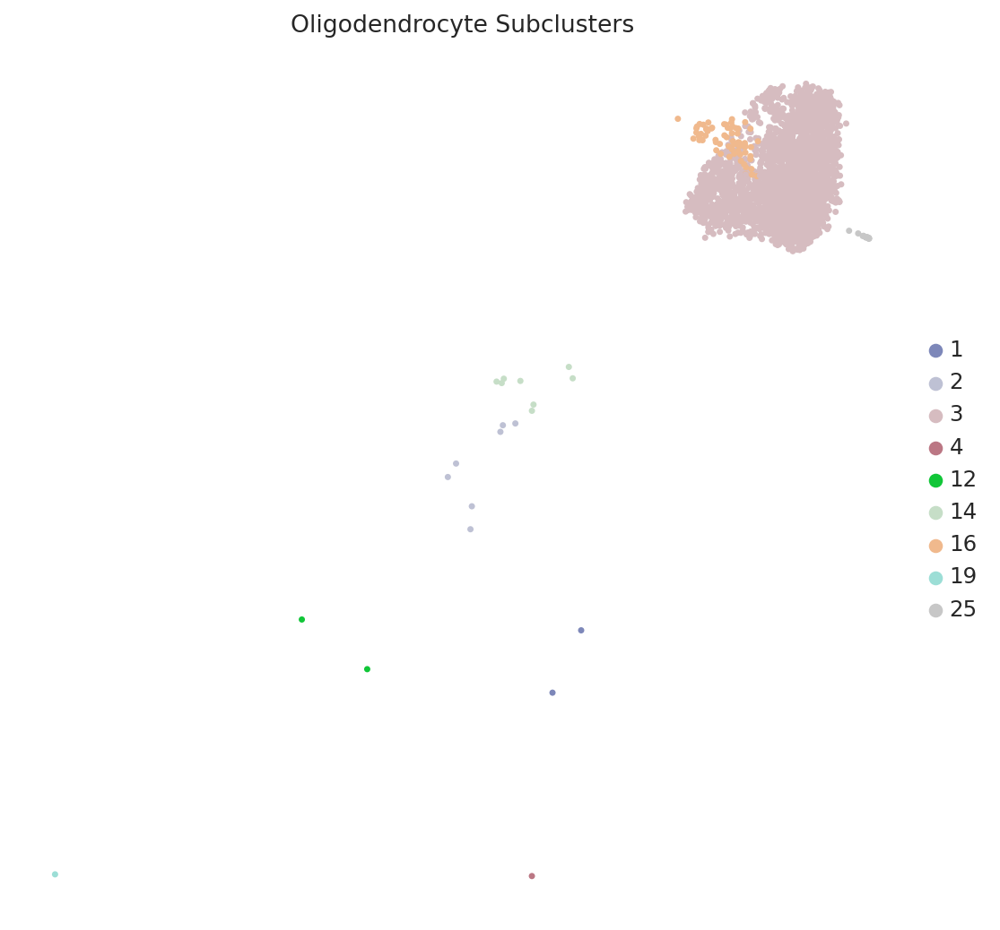

In [364]:
sc.pl.umap(adata_oligo, color=["leiden"], title="Oligodendrocyte Subclusters")

In [ ]:
adata_oligo.write("Downloads/Data_Brain/Brain_Oligodendrocyte.h5ad")

## Gene Enrichment

In [151]:
import scanpy as sc
import scvi
import seaborn as sns
import numpy as np
import pandas as pd

In [365]:
adata_oligo.obs

,cell_name,sample,patient,cell_type,cell_subtype,complexity,cell_cycle_phase,source,cancer_type,technology,...,log1p_total_counts_hb,pct_counts_hb,outlier,mt_outlier,_scvi_batch,_scvi_labels,highlight,oligodendrocyte_score,leiden,status
3,SF10022_AAACCCAGTCTACGAT-1,SF10022,SF10022,Oligodendrocyte,NaN,2680,NaN,NaN,Glioblastoma,10x,...,2.484907,0.155214,False,False,0,0,Oligodendrocyte,1.031272,3,SF10022
13,SF10022_AAAGGGCTCACCCTGT-1,SF10022,SF10022,Oligodendrocyte,NaN,2460,NaN,NaN,Glioblastoma,10x,...,0.693147,0.018484,False,False,0,0,Oligodendrocyte,1.045743,3,SF10022
32,SF10022_AACAACCAGACCCGCT-1,SF10022,SF10022,Oligodendrocyte,NaN,3940,NaN,NaN,Glioblastoma,10x,...,1.945910,0.048150,False,False,0,0,Oligodendrocyte,1.130654,3,SF10022
39,SF10022_AACAAGAGTGTAAACA-1,SF10022,SF10022,Oligodendrocyte,NaN,3640,NaN,NaN,Glioblastoma,10x,...,1.945910,0.056572,False,False,0,0,Oligodendrocyte,1.077792,3,SF10022
65,SF10022_AACTTCTAGTAATACG-1,SF10022,SF10022,Oligodendrocyte,NaN,418,NaN,NaN,Glioblastoma,10x,...,0.000000,0.000000,False,False,0,0,Oligodendrocyte,0.615066,3,SF10022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23636,23637,PJ048,PJ048,Oligodendrocyte,NaN,432,NaN,NaN,Glioblastoma,Microwell array-based platform,...,0.000000,0.000000,False,False,0,0,Oligodendrocyte,2.163944,16,PJ048
23657,23658,PJ048,PJ048,Oligodendrocyte,NaN,418,NaN,NaN,Glioblastoma,Microwell array-based platform,...,0.000000,0.000000,False,False,0,0,Oligodendrocyte,1.526435,16,PJ048
23662,23663,PJ048,PJ048,Oligodendrocyte,NaN,447,NaN,NaN,Glioblastoma,Microwell array-based platform,...,0.000000,0.000000,False,False,0,0,Oligodendrocyte,1.988804,16,PJ048
23729,23730,PJ048,PJ048,Oligodendrocyte,NaN,424,NaN,NaN,Glioblastoma,Microwell array-based platform,...,0.693147,0.190476,False,False,0,0,Oligodendrocyte,1.364488,16,PJ048


In [366]:
sc.tl.rank_genes_groups(adata_oligo, groupby='sample', method='wilcoxon',reference='SF10022')

In [367]:
'rank_genes_groups' in adata_oligo.uns  # should return True

True

In [368]:
adata_oligo.uns['rank_genes_groups']

{'params': {'groupby': 'sample',
  'reference': 'SF10022',
  'method': 'wilcoxon',
  'use_raw': True,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('CRYAB', 'FTH1', 'FTH1', 'FMN1', 'XIST', 'PCDH9', 'CLDN11', 'ERBB4', 'LRRC7'),
            ('ACTB', 'PLP1', 'CALM2', 'ADARB2', 'LRP1B', 'PDE1C', 'CERCAM', 'SUMF1', 'CERCAM'),
            ('EEF1A1', 'EEF1A1', 'PTMA', 'MBP', 'BACE2', 'IL1RAPL1', 'PDE1C', 'GPR98', 'PCDH9'),
            ...,
            ('NPAS3', 'FRMD5', 'FRMD5', 'PTPRK', 'CH507-528H12.1', 'DPP6', 'GRID2', 'ZFYVE16', 'FBXO32'),
            ('DLG2', 'DLG2', 'IL1RAPL1', 'CH507-528H12.1', 'NLGN4Y', 'GRID2', 'B2M', 'FNBP1', 'COL18A1'),
            ('IL1RAPL1', 'IL1RAPL1', 'DLG2', 'NEAT1', 'UTY', 'NEAT1', 'NEAT1', 'ZNF652', 'NEAT1')],
           dtype=[('PJ018', 'O'), ('PJ030', 'O'), ('PJ048', 'O'), ('SF4297', 'O'), ('SF6996', 'O'), ('SF9259R', 'O'), ('SF9259S', 'O'), ('SF10127', 'O'), ('SF12090', 'O')]),
 'scores': rec.array([( 9.5829115,  9.327379

In [369]:
result = adata_oligo.uns['rank_genes_groups']

In [370]:
# Get DEGs as dataframe
degs = sc.get.rank_genes_groups_df(adata_oligo, group=None)

In [371]:
degs

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,PJ018,CRYAB,9.582911,5.837426,9.434689e-22,1.127588e-18
1,PJ018,ACTB,9.464312,4.029376,2.955019e-21,2.546790e-18
2,PJ018,EEF1A1,9.181066,4.835440,4.268461e-20,2.243996e-17
3,PJ018,FTH1,9.155951,5.807593,5.388147e-20,2.627377e-17
4,PJ018,H3F3B,9.024792,6.164726,1.800367e-19,7.889610e-17
...,...,...,...,...,...,...
354955,SF12090,DLC1,-7.003413,-1.722419,2.498004e-12,9.852126e-09
354956,SF12090,ST6GALNAC3,-7.170226,-2.059655,7.487411e-13,4.218621e-09
354957,SF12090,FBXO32,-7.193281,-3.073298,6.325244e-13,4.157793e-09
354958,SF12090,COL18A1,-7.494358,-4.306615,6.662388e-14,6.569114e-10


In [372]:
degs.head()    #here logfold is in the base of the logarithm of 2.

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,PJ018,CRYAB,9.582911,5.837426,9.434689e-22,1.127588e-18
1,PJ018,ACTB,9.464312,4.029376,2.955019e-21,2.546790e-18
2,PJ018,EEF1A1,9.181066,4.835440,4.268461e-20,2.243996e-17
3,PJ018,FTH1,9.155951,5.807593,5.388147e-20,2.627377e-17
4,PJ018,H3F3B,9.024792,6.164726,1.800367e-19,7.889610e-17


In [373]:
import pandas as pd

# significance threshold
alpha = 0.05  

# Up-regulated
degs_up = degs[(degs["pvals_adj"] < alpha) & (degs["logfoldchanges"] > 0)]

# Down-regulated
degs_down = degs[(degs["pvals_adj"] < alpha) & (degs["logfoldchanges"] < 0)]


In [374]:
import gseapy as gp

# Get the upregulated genes
gene_list_up = degs_up["names"].tolist()

In [375]:
# Run Enrichr
enr_up = gp.enrichr(
    gene_list=gene_list_up,
    gene_sets="GO_Biological_Process_2023",
    organism="Human",  # or "Mouse" depending on your data
    outdir=None
)

# Get the results as DataFrame
enr_results = enr_up.results


In [376]:
enr_results = enr_results.copy()
enr_results['Term'] = enr_results['Term'].str.replace(r'\s*\(GO:\d+\)', '', regex=True)

In [377]:
import matplotlib.pyplot as plt

# Sort by adjusted p-value
enr_results_sorted = enr_results.sort_values("Adjusted P-value")

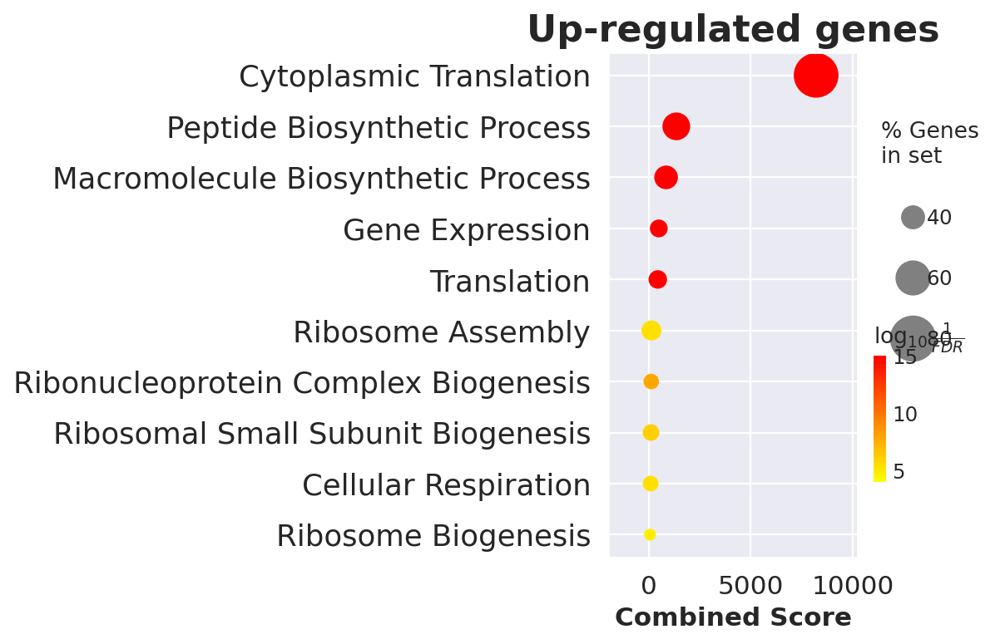

In [378]:
# Dotplot
gp.dotplot(
    enr_results_sorted,
    figsize=(3,5),
    title="Up-regulated genes",
    cmap=plt.cm.autumn_r
)
plt.show()


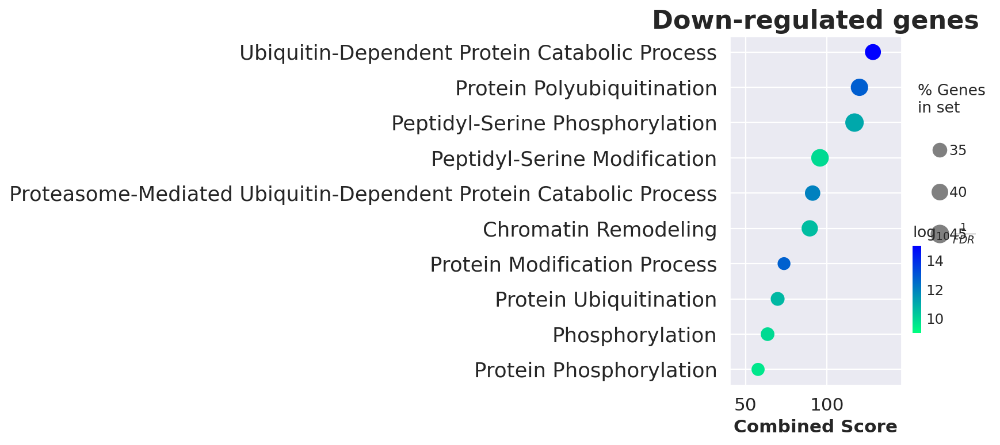

In [379]:
import gseapy as gp
import matplotlib.pyplot as plt

# Prepare down-regulated gene list
gene_list_down = degs_down["names"].tolist()

# Run Enrichr
enr_down = gp.enrichr(
    gene_list=gene_list_down,
    gene_sets="GO_Biological_Process_2023",
    organism="Human",  # or Mouse
    outdir=None
)

# Get results DataFrame
enr_results = enr_down.results.copy()

# Clean GO terms
enr_results['Term'] = enr_results['Term'].str.replace(r'\s*\(GO:\d+\)', '', regex=True)

# Sort by adjusted p-value
enr_results_sorted = enr_results.sort_values("Adjusted P-value")

# Dotplot
gp.dotplot(
    enr_results_sorted,
    figsize=(3,5),
    title="Down-regulated genes",
    cmap=plt.cm.winter_r
)
plt.show()


In [345]:
import matplotlib.pyplot as plt

# Number of top pathways to show
top_n = 10

# UP-regulated pathways
enr_up_sorted = enr_up.results.copy()
enr_up_sorted['Term'] = enr_up_sorted['Term'].str.replace(r'\s*\(GO:\d+\)', '', regex=True)
top_up = enr_up_sorted.nsmallest(top_n, 'Adjusted P-value')  # smallest p-value = most significant

# DOWN-regulated pathways
enr_down_sorted = enr_down.results.copy()
enr_down_sorted['Term'] = enr_down_sorted['Term'].str.replace(r'\s*\(GO:\d+\)', '', regex=True)
top_down = enr_down_sorted.nsmallest(top_n, 'Adjusted P-value')


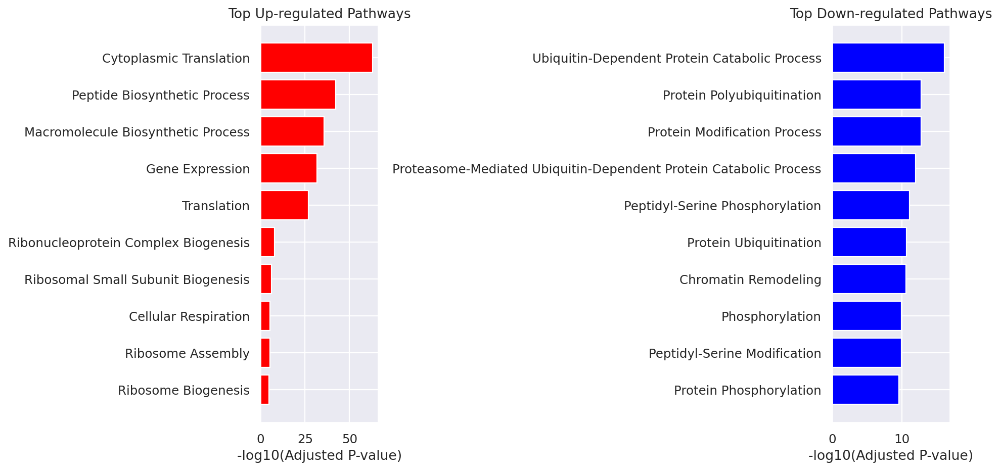

In [346]:
fig, axes = plt.subplots(1, 2, figsize=(12,6), sharex=False)

# UP-regulated
axes[0].barh(top_up['Term'], -np.log10(top_up['Adjusted P-value']), color='red')
axes[0].set_title('Top Up-regulated Pathways')
axes[0].set_xlabel('-log10(Adjusted P-value)')
axes[0].invert_yaxis()  # highest on top

# DOWN-regulated
axes[1].barh(top_down['Term'], -np.log10(top_down['Adjusted P-value']), color='blue')
axes[1].set_title('Top Down-regulated Pathways')
axes[1].set_xlabel('-log10(Adjusted P-value)')
axes[1].invert_yaxis()  # highest on top

plt.tight_layout()
plt.show()


<Axes: title={'center': 'Top GO Terms (Exploratory)'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

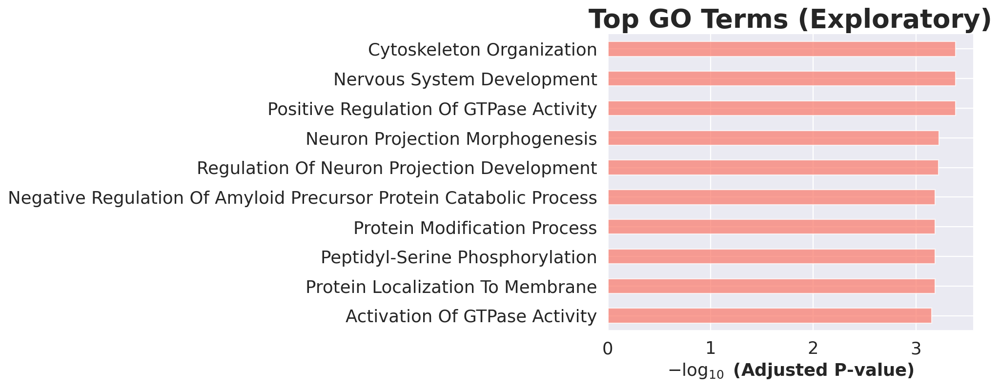

In [380]:
import gseapy as gp

# Copy results and clean GO term names
top_terms = enr.results.copy()
top_terms['Term'] = top_terms['Term'].str.replace(r'\s*\(GO:\d+\)', '', regex=True)

# Sort by adjusted p-value and take top 15
top_terms = top_terms.sort_values('Adjusted P-value').head(15)

# Plot
gp.barplot(
    top_terms,
    x='Adjusted P-value',
    title='Top GO Terms (Exploratory)',
    figsize=(6, 5),
    cutoff=1.0  # disables strict filtering
)


In [381]:
top_terms

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2023,Nervous System Development,75/433,1.789867e-07,0.000409,0,0,2.047789,31.814357,ROBO2;TENM1;SH3GL3;PLXND1;ZMYND8;MTR;MSI2;PKD1...
1,GO_Biological_Process_2023,Positive Regulation Of GTPase Activity,48/234,2.065286e-07,0.000409,0,0,2.509653,38.630653,USP6NL;TBC1D9B;DOCK9;CCDC125;RASGRF2;DOCK7;RAS...
2,GO_Biological_Process_2023,Cytoskeleton Organization,29/111,3.021986e-07,0.000409,0,0,3.423954,51.401020,MAST4;MAST3;SH3KBP1;MAST2;LIMD1;SIPA1L3;FGD4;P...
3,GO_Biological_Process_2023,Neuron Projection Morphogenesis,34/146,5.854844e-07,0.000594,0,0,2.942044,42.220757,GPM6A;NLGN1;TRIO;ATL1;DOCK7;LRP4;DOCK10;ALCAM;...
4,GO_Biological_Process_2023,Regulation Of Neuron Projection Development,38/174,7.388578e-07,0.000600,0,0,2.710128,38.262025,SCARB2;DDR1;NLGN1;AVIL;PTPRO;LPAR1;PSEN1;PTN;F...
5,GO_Biological_Process_2023,Negative Regulation Of Amyloid Precursor Prote...,10/18,1.197908e-06,0.000650,0,0,12.028841,164.012454,NTRK2;PRNP;RTN1;GGA3;BIN1;FLOT2;APOE;CLU;RTN4;...
6,GO_Biological_Process_2023,Protein Localization To Membrane,40/192,1.374468e-06,0.000650,0,0,2.552959,34.458414,NLGN1;CD81;STXBP1;NRXN1;NRXN2;PTN;LRP6;IKBKB;E...
7,GO_Biological_Process_2023,Peptidyl-Serine Phosphorylation,35/158,1.407645e-06,0.000650,0,0,2.757526,37.153776,GPI;CAMK2D;MAST4;TNKS;MAST3;MAST2;PKD1;TTBK2;I...
8,GO_Biological_Process_2023,Protein Modification Process,106/711,1.441378e-06,0.000650,0,0,1.718104,23.108353,PGAP1;PDCD6;TESK2;UBE2L6;AKT3;PIM3;MACROD2;EPH...
9,GO_Biological_Process_2023,Protein Phosphorylation,80/500,1.930997e-06,0.000698,0,0,1.860482,24.479247,DDR1;GPI;MAST4;MAST3;MAST2;TESK2;PKD1;IGF1R;IK...
